# Problem Statement
Music genre clustering based on audio features.
Music Recommendation  Systems and genre discovery.

# Objectives
Music genres are traditionally assigned based on subjective classification or metadata (e.g., rock, jazz, hip-hop), but this approach may overlook the nuanced musical characteristics that define each genre. By analyzing the audio features of songs, we can uncover hidden patterns and group songs that share similar acoustic traits, such as rhythm, tempo, and frequency distribution. This approach helps in better understanding the structure of music and can be used for music recommendation systems, automated playlist creation, and genre discovery.

# Use case
 To contribute to deeper understanding of the relationship between musical features and genre, enabling better music recommendations, genre classification, and playlist creation.

In [1]:
#Here we evaluated 10,000 values to predict the future scope of music genre and based on that we can create music-recommendation system.
#It will contribute to deeper understanding of the relationship between musical features and genres, enabling better music recommendation,
#and playlist creation.

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
%matplotlib inline
# libraries importing 

In [2]:
musicgenre = pd.read_csv('music_genre_audio_features.csv')


 #csv file load  

In [3]:
musicgenre.head() #Top five header values

,track_id,genre,tempo,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,duration_ms
0,track_00001,EDM,121.954006,0.930432,0.951494,-1.341474,0.058367,0.040068,0.063302,0.237659,0.587889,231667
1,track_00002,Pop,115.567417,0.744843,0.680768,-3.805145,0.070837,0.363905,0.006849,0.237373,0.865320,186922
2,track_00003,Country,92.771148,0.568290,0.462856,-7.268028,0.093591,0.431344,0.144054,0.237457,0.528726,291769
3,track_00004,Classical,66.507045,0.120391,0.221394,-28.751049,0.069265,0.818469,0.967401,0.216945,0.469142,383184
4,track_00005,EDM,121.802060,0.869268,0.954448,-2.633934,0.054709,0.091265,0.268227,0.199574,0.836723,272307


In [4]:
musicgenre.tail() #Bottom five values

,track_id,genre,tempo,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,duration_ms
9995,track_09996,EDM,128.397803,0.865044,0.941669,-2.200205,0.062144,0.055215,0.228519,0.150239,0.717188,257853
9996,track_09997,Blues,88.984688,0.749812,0.745281,-6.446383,0.098873,0.403707,0.014555,0.204530,0.788996,215139
9997,track_09998,Hip-Hop,92.025806,0.890981,0.744549,-5.616959,0.410055,0.151290,0.074214,0.186843,0.538139,248382
9998,track_09999,Blues,88.701196,0.774916,0.551609,-6.917668,0.058126,0.660532,0.124429,0.234956,0.657587,203907
9999,track_10000,Classical,66.926287,0.268579,0.275068,-12.975032,0.048370,0.933298,0.905735,0.331346,0.255752,479561


In [5]:
musicgenre.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track_id          10000 non-null  object 
 1   genre             10000 non-null  object 
 2   tempo             10000 non-null  float64
 3   danceability      10000 non-null  float64
 4   energy            10000 non-null  float64
 5   loudness          10000 non-null  float64
 6   speechiness       10000 non-null  float64
 7   acousticness      10000 non-null  float64
 8   instrumentalness  10000 non-null  float64
 9   liveness          10000 non-null  float64
 10  valence           10000 non-null  float64
 11  duration_ms       10000 non-null  int64  
dtypes: float64(9), int64(1), object(2)
memory usage: 937.6+ KB


In [6]:
musicgenre.describe()

,tempo,danceability,energy,loudness,speechiness,acousticness,instrumentalness,liveness,valence,duration_ms
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,110.363540,0.630478,0.671494,-7.857953,0.105550,0.405511,0.254019,0.234403,0.599069,267802.417700
std,28.009211,0.193145,0.212452,5.468705,0.119477,0.278624,0.326635,0.089111,0.148238,79670.619967
min,36.016715,0.100434,0.100843,-29.959934,0.020028,0.000010,0.000033,0.100009,0.200210,150205.000000
25%,88.205026,0.539839,0.540906,-9.507145,0.051319,0.160639,0.043908,0.164625,0.512397,213772.750000
50%,105.716470,0.668936,0.699927,-6.586354,0.068012,0.373012,0.112471,0.225770,0.599757,250573.000000
75%,130.726965,0.760936,0.837776,-4.384579,0.091169,0.606058,0.222206,0.280944,0.709887,290755.250000
max,198.067174,0.949746,0.999983,-0.001514,0.599433,0.999903,0.999913,0.499617,0.899956,599886.000000


In [7]:
musicgenre.columns

Index(['track_id', 'genre', 'tempo', 'danceability', 'energy', 'loudness',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'duration_ms'],
      dtype='object')

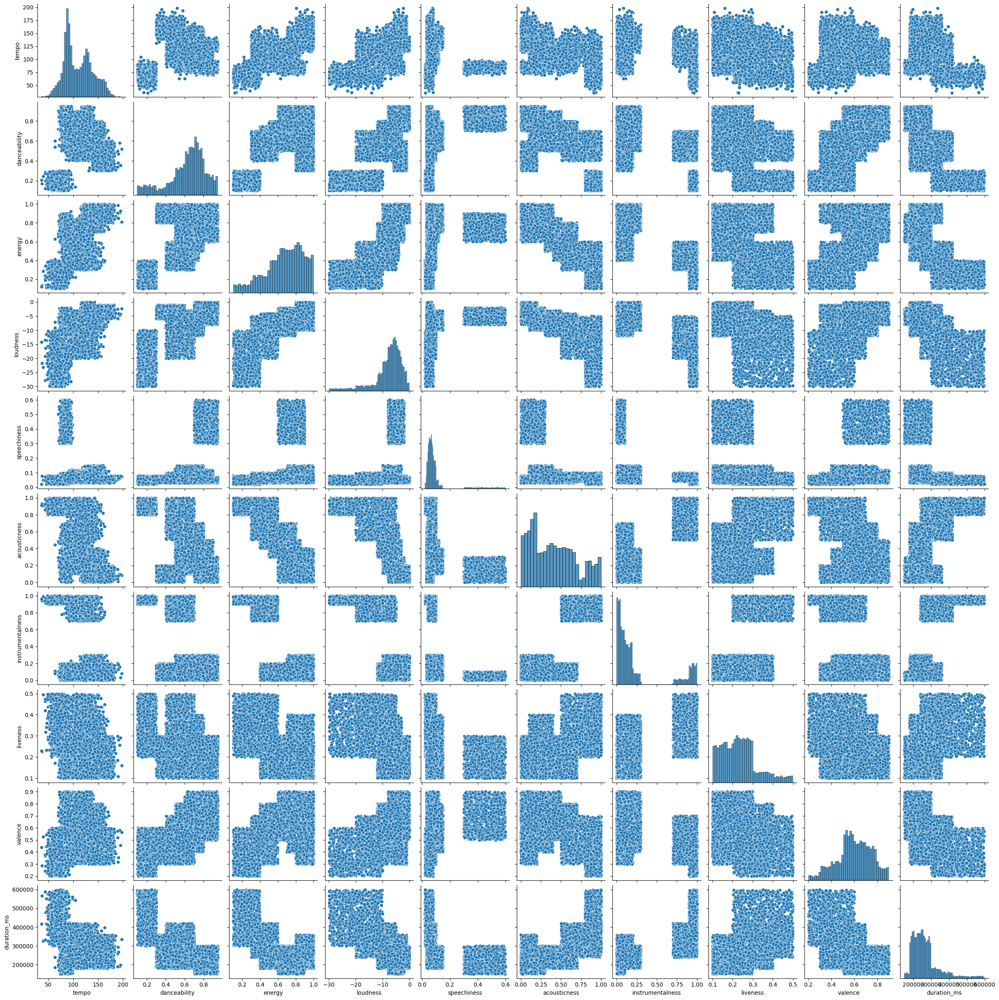

In [8]:
sns.pairplot(musicgenre) #ploting pairwise relationships in a dataset of each column

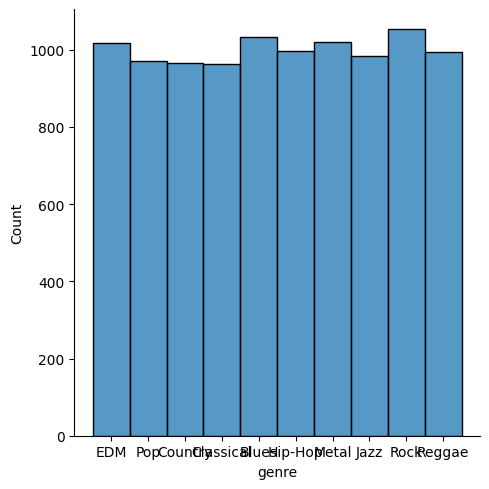

In [9]:
sns.displot(musicgenre['genre']) #histographic ploting

In [10]:
 #importing plolty

In [11]:
top_genres = musicgenre['genre'].value_counts().nlargest(9).index # Get the top 9 genres by frequency
musicgenre_filtered = musicgenre[musicgenre['genre'].isin(top_genres)] # Filter the DataFrame to keep only the top 9 genres
darker_colors = {
    'danceability': '#8C564B',   # Dark brown
    'energy': '#E377C2',       # Dark pink
    'loudness': '#2CA02C',       # Dark green
    'speechiness': '#9467BD',    # Dark purple
    'acousticness': '#17BECF',   # Dark cyan
    'instrumentalness': '#FF7F0E', # Dark orange
    'liveness': '#F7B6D2',     # Light dark pink
    'valence': '#DBDB8D'        # Dark yellow-green
}
# Create the bar chart
fig = px.bar(musicgenre_filtered, x='genre', y=['danceability', 'energy', 'loudness',
       'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence'], barmode='group', color_discrete_map=darker_colors)
# Update the layout
fig.update_layout(yaxis_title="audio feature", xaxis_title="genre", title='Audio Features for Top 9 Genres')
fig.update_layout(title={'x': 0.5, 'xanchor': 'center'})

# Show the plot
fig.show()

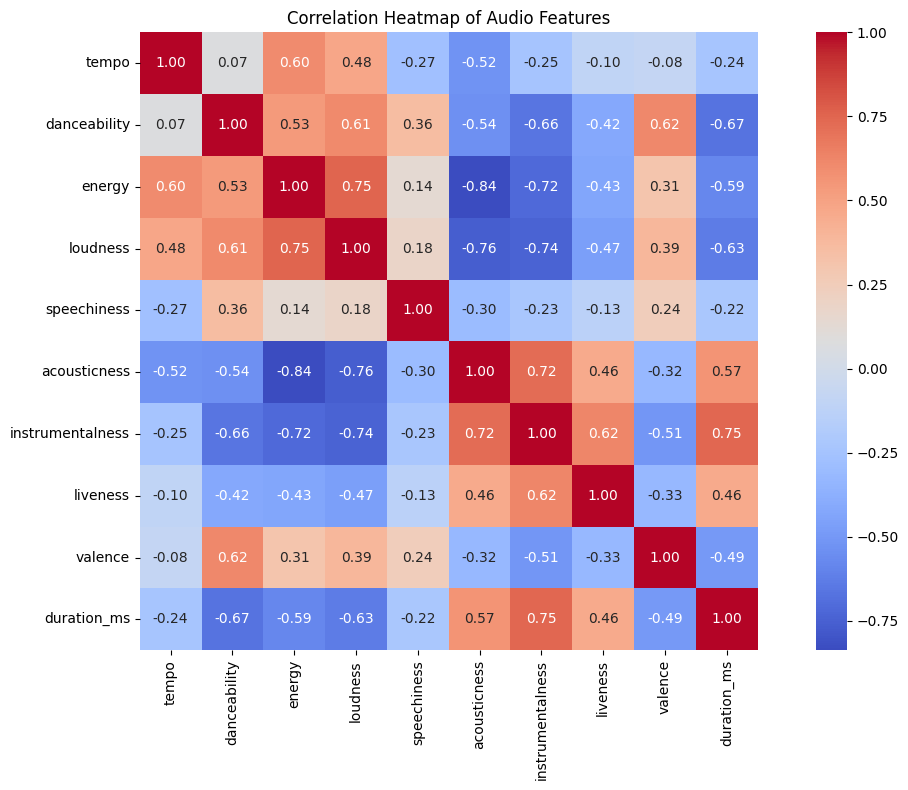

In [12]:
numeric_data = musicgenre.drop(columns=["track_id", "genre"]) 

# Create the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_data.corr(), annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title("Correlation Heatmap of Audio Features")
plt.tight_layout()
plt.show()

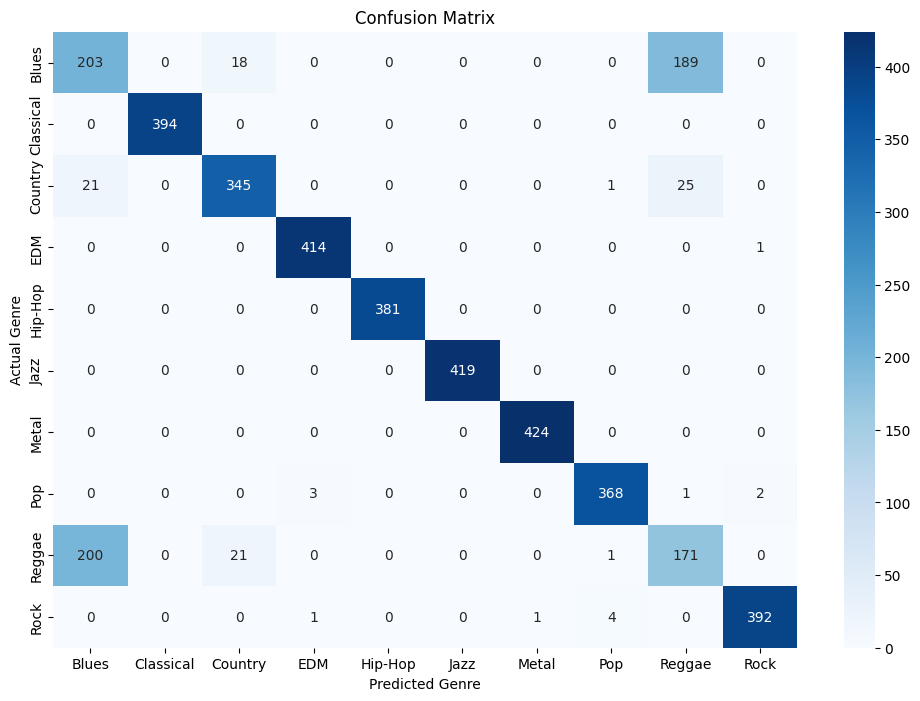

In [34]:
# Make predictions
Y_pred = model.predict(X_test)

# Create the confusion matrix
cm = confusion_matrix(Y_test, Y_pred, labels=model.classes_)

# Plot it
plt.figure(figsize=(12, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=model.classes_, yticklabels=model.classes_)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Genre')
plt.ylabel('Actual Genre')
plt.show()

In [13]:
X = musicgenre[['tempo', 'danceability', 'energy', 'loudness', 'speechiness',
                'acousticness', 'instrumentalness', 'liveness', 'valence', 'duration_ms']]
Y = musicgenre['genre']

In [14]:
from sklearn.model_selection import train_test_split # split dataset into training and testing sets.

In [15]:
X_train,X_test,Y_train,Y_test = train_test_split(X,Y,test_size=0.4, random_state=101)

In [16]:
from sklearn.linear_model import LinearRegression

In [17]:
lm = LinearRegression


In [18]:
from sklearn.ensemble import RandomForestClassifier

model = RandomForestClassifier(random_state=101)
model.fit(X_train, Y_train)
#classify genres

RandomForestClassifier(random_state=101)

In [19]:
predictions = model.predict(X_test)

In [20]:

# Create the Linear Regression model
lm = LinearRegression(copy_X=True, fit_intercept=True)

In [21]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()
model.fit(X_train, Y_train)
#classify genres

RandomForestClassifier()

In [35]:

# Evaluate
from sklearn.metrics import accuracy_score, classification_report
print("Accuracy:", accuracy_score(Y_test, predictions))
print(classification_report(Y_test, predictions))


Accuracy: 0.87475
              precision    recall  f1-score   support

       Blues       0.46      0.53      0.49       410
   Classical       1.00      1.00      1.00       394
     Country       0.91      0.88      0.89       392
         EDM       0.99      1.00      1.00       415
     Hip-Hop       1.00      1.00      1.00       381
        Jazz       1.00      1.00      1.00       419
       Metal       1.00      1.00      1.00       424
         Pop       0.99      0.98      0.98       374
      Reggae       0.42      0.37      0.40       393
        Rock       0.99      0.98      0.99       398

    accuracy                           0.87      4000
   macro avg       0.88      0.87      0.87      4000
weighted avg       0.88      0.87      0.87      4000



In [23]:
predictions = model.predict(X_test)



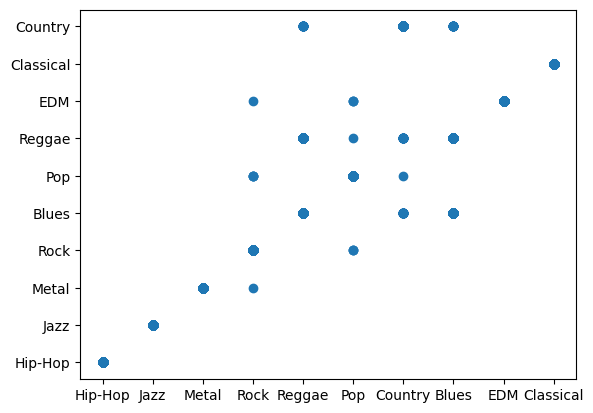

In [24]:
plt.scatter(Y_test,predictions)

In [25]:
from sklearn.ensemble import RandomForestClassifier

# Fit the model
model = RandomForestClassifier(random_state=101)
model.fit(X_train, Y_train)

# Make predictions
Y_test_predictions = model.predict(X_test)


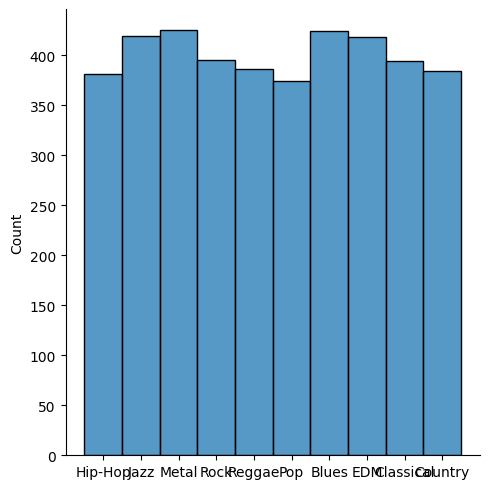

In [26]:
import seaborn as sns
sns.displot(Y_test_predictions, bins=50)


<Axes: ylabel='count'>

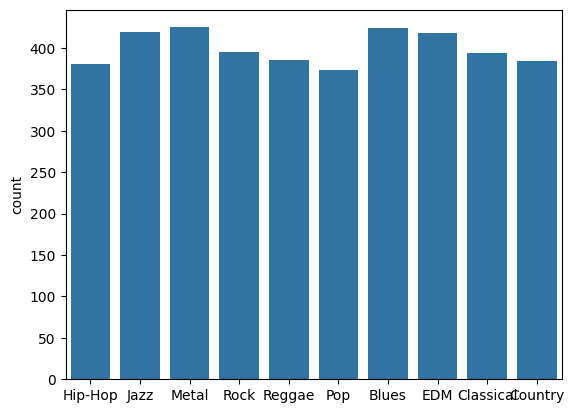

In [27]:
sns.countplot(x=Y_test_predictions)
#categorical predictions

In [28]:
from sklearn import metrics

In [29]:
from sklearn.metrics import mean_absolute_error, mean_squared_error


In [30]:

from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [36]:
#printing accuracy, Classification Report, and confusion matrics
print("Accuracy:", accuracy_score(Y_test, Y_test_predictions))
print("Classification Report:\n", classification_report(Y_test, Y_test_predictions))
print("Confusion Matrix:\n", confusion_matrix(Y_test, Y_test_predictions))

Accuracy: 0.87775
Classification Report:
               precision    recall  f1-score   support

       Blues       0.48      0.50      0.49       410
   Classical       1.00      1.00      1.00       394
     Country       0.90      0.88      0.89       392
         EDM       0.99      1.00      0.99       415
     Hip-Hop       1.00      1.00      1.00       381
        Jazz       1.00      1.00      1.00       419
       Metal       1.00      1.00      1.00       424
         Pop       0.98      0.98      0.98       374
      Reggae       0.44      0.44      0.44       393
        Rock       0.99      0.98      0.99       398

    accuracy                           0.88      4000
   macro avg       0.88      0.88      0.88      4000
weighted avg       0.88      0.88      0.88      4000

Confusion Matrix:
 [[203   0  18   0   0   0   0   0 189   0]
 [  0 394   0   0   0   0   0   0   0   0]
 [ 21   0 345   0   0   0   0   1  25   0]
 [  0   0   0 414   0   0   0   0   0   1]
 [  0   